# **`Image classification using CNNs in Keras`**

### **`Context: `**
Can you differentiate a weed from a crop seedling?

The ability to do so effectively can mean better crop yields and better stewardship of the environment.

The Aarhus University Signal Processing group, in collaboration with University of Southern Denmark, has recently released a dataset containing images of unique plants belonging to 12 species at several growth stages.

### **`Learning Outcomes: `**
*   Pre-processing of image data.
*   Visualization of images.
*   Building CNN.
*   Evaluate the Model.
*   The motive of the project is to make the learners capable to handle images/image classification problems, during this process you should also be capable to handle real image files, not just limited to a numpy array of image pixels.

### **`Guide to solve the project seamlessly: `**
Here are the points which will help you to solve the problem efficiently:
*   Don't use data from Kaggle. Instead use the data provided with this problem statement.
*   Upload the "images.npy" and “Labels.csv” file to google drive.
*   Then you can use the dataset path in the Google Colab notebook to do further steps related to project problem statement.
*   You can set runtime type to “GPU” in Google Colab, so that the code will run faster as you will be using CNN to fit your model.

###  **`Data Description: `**
You are provided with a dataset of images of plant seedlings at various stages of grown. Each image has a filename that is its
unique id. The dataset comprises 12 plant species. The goal of the project is to create a classifier capable of determining a plant's
species from a photo.

### **`Dataset: `**
The data file names are:

*   images.npy
*   Label.csv

The original files are from Kaggle. Due to the large volume of data, the images were converted to images.npy file and the labels
are also put into the Labels.csv. So that you can work on the data/project seamlessly without worrying about the high data
volume.
The following code was used to convert the large dataset of images to numpy array:

The data before conversion was downloaded from Kaggle project site: https://www.kaggle.com/c/plant-seedlings-classification/data?select=train

In [1]:
#This code is an illustration of how the data for this project was generated.

# Import necessary libraries.

#import math
#import numpy as np
#import pandas as pd
#from glob import glob

#data_path = '/content/drive/My Drive/Colab Notebooks/data/plant_seedlings/train.zip'
#!mkdir dataset

# Extract the files from dataset to temp_train and temp_test folders (as the dataset is a zip file.)
#from zipfile import ZipFile
#with ZipFile(data_path, 'r') as zip:
# zip.extractall('./dataset')
#path = "/content/dataset/*/*.*" # The path to all images in training set. (* means include all folders and files.)

#files = glob(path)
#trainImg = [] # Initialize empty list to store the image data as numbers.
#trainLabel = [] # Initialize empty list to store the labels of images
#j = 1
#num = len(files)
# Obtain images and resizing, obtain labels
#for img in files:
# Append the image data to trainImg list.
# Append the labels to trainLabel list.
# print(str(j) + "/" + str(num), end="\r")
# trainImg.append(cv2.resize(cv2.imread(img), (128, 128))) # Get image (with resizing to 128x128)
# trainLabel.append(img.split('/')[-2]) # Get image label (folder name contains the class to which the image belong)
# j += 1
#trainImg = np.asarray(trainImg) # Train images set
#trainLabel = pd.DataFrame(trainLabel, columns=["Label"]) # Train labels set
#print(trainImg.shape)
#print(trainLabel.shape)
#trainLabel.to_csv('Labels.csv', index=False)
#np.save('plantimages', trainImg)

## **`Steps and tasks:`**


###  **`Deliverable – 1:`** 
Import the libraries, load dataset, print shape of data, visualize the images in dataset. **(5 Marks)**

###  **`Deliverable – 2:`**
Data Pre-processing: **(15 Marks)**
1.   Normalization.
2.   Gaussian Blurring.
3.   Visualize data after pre-processing.

###  **`Deliverable – 3:`** 
Make data compatible: **(10 Marks)**
1.   Convert labels to one-hot-vectors.
2.   Print the label for y_train[0].
3.   Split the dataset into training, testing, and validation set. (**Hint**: First split images and labels into training and testing set with test_size = 0.3. Then further split test data
into test and validation set with test_size = 0.5)
4.   Check the shape of data, Reshape data into shapes compatible with Keras models if it’s not already. If it’s already in the compatible shape, then comment in the notebook that it’s already in compatible shape.

###  **`Deliverable – 4:`** 
Building CNN **(15 Marks)**
1.   Define layers.
2.   Set optimizer and loss function. (Use Adam optimizer and categorical crossentropy.)

###  **`Deliverable – 5:`** 
Fit and evaluate model and print confusion matrix. **(10 Marks)**

###  **`Deliverable – 6:`** 
Visualize predictions for x_test[2], x_test[3], x_test[33], x_test[36], x_test[59]. **(5 Marks)**

###  **`Note:`** 
Do not download the dataset from Kaggle, as:
*   The dataset is big.
*   The dataset has 2 files for train and test images, but the labels are only for the train file. Test file has no labels associated with it. So, when you want to know the accuracy of model on test images, there’s no way to measure it. That’s why the data provided has only train images and their labels. For our purpose we use this for our training and testing and validation purpose.

# <a id = "link101"></a> `Index: `

- <a href = #link102>**Deliverable – 1**</a>
- <a href = #link103>**Deliverable – 2**</a>
- <a href = #link104>**Deliverable – 3**</a>
- <a href = #link105>**Deliverable – 4**</a>
- <a href = #link106>**Deliverable – 5**</a>
- <a href = #link107>**Deliverable – 6**</a>

# **`Deliverable – 1:`** <a id = "link102"></a>

<a href = #link101> Back to Index </a>

In [2]:
from google.colab import drive
#drive.mount('/content/drive')

In [3]:
%tensorflow_version 2.x
import tensorflow
tensorflow.__version__

'2.4.1'

In [4]:
#import libraries
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
%matplotlib inline 

In [6]:
from sklearn import metrics
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

In [7]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Dropout, MaxPooling2D, Flatten
from keras import models, layers, callbacks

In [8]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix, classification_report

In [9]:
import cv2
from google.colab.patches import cv2_imshow

In [10]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical

In [11]:
#Read Data
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive/'My Drive'/'Colab Notebooks'
labels  = pd.read_csv('Labels.csv')
labels.head(5)

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive/My Drive/Colab Notebooks


,Label
0,Small-flowered Cranesbill
1,Small-flowered Cranesbill
2,Small-flowered Cranesbill
3,Small-flowered Cranesbill
4,Small-flowered Cranesbill


In [12]:
images = np.load('images.npy')

In [13]:
#Stastical Analysis
print(images.shape)

print(labels.shape)

(4750, 128, 128, 3)
(4750, 1)


In [14]:
# Following code gives the first image. The code is commented for better visibility of notebook.

#images[0]

In [15]:
# Following gives the first row in the first image. The code is commented for better visibility of notebook.

#images[0][0]

In [16]:
#Following gives the first pixel in the first image.

images[0][0][0]

array([35, 52, 78], dtype=uint8)

In [17]:
#Step4: Find number of unique values in each column. Analyse outcome for categorical variables.
labels.nunique() # Number of unique values in a column

Label    12
dtype: int64

In [18]:
# value counts gives us how many times does the value 
print(labels['Label'].value_counts(normalize=True))

Loose Silky-bent             0.137684
Common Chickweed             0.128632
Scentless Mayweed            0.108632
Small-flowered Cranesbill    0.104421
Fat Hen                      0.100000
Charlock                     0.082105
Sugar beet                   0.081053
Cleavers                     0.060421
Black-grass                  0.055368
Shepherds Purse              0.048632
Common wheat                 0.046526
Maize                        0.046526
Name: Label, dtype: float64


In [19]:
print(labels['Label'].value_counts())

Loose Silky-bent             654
Common Chickweed             611
Scentless Mayweed            516
Small-flowered Cranesbill    496
Fat Hen                      475
Charlock                     390
Sugar beet                   385
Cleavers                     287
Black-grass                  263
Shepherds Purse              231
Common wheat                 221
Maize                        221
Name: Label, dtype: int64


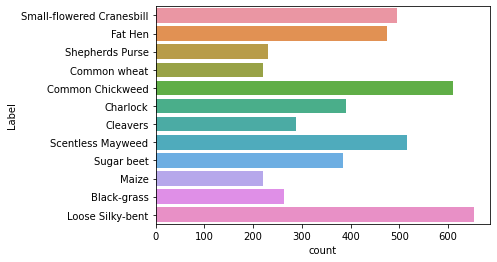

In [20]:
sns.countplot(y=labels["Label"])

### **`Observation:`** 


<a href = #link101> Back to Index </a>

1. Some classes e.g. Loose Silky-bent are represented more frequently in dataset than some other classes e.g. Maize, Common Wheat etc. Therefore some bias and classification error might occur.

In [21]:
from random import randint


from keras.preprocessing import image

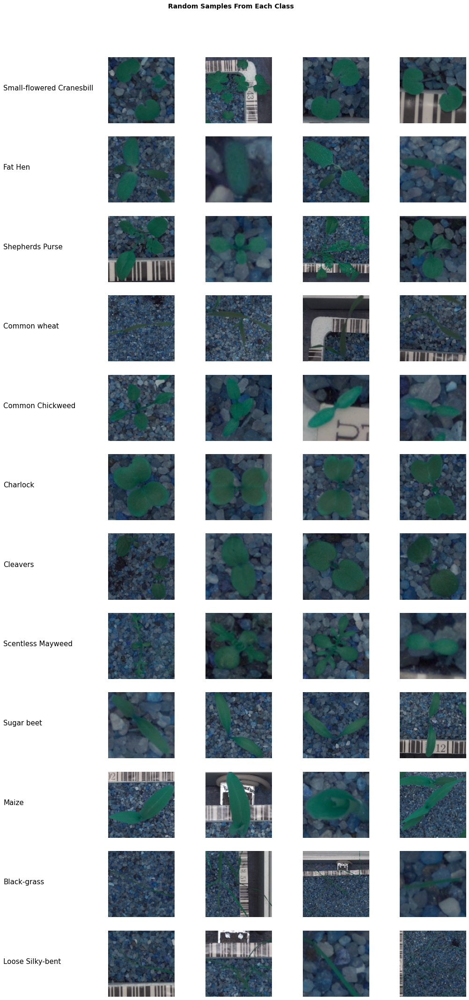

In [22]:

# Find the start and end indexes of each classification
fig= plt.figure(figsize= (18, 40))
fig.suptitle('Random Samples From Each Class', fontsize=14, y=.92, horizontalalignment='center', weight='bold')

columns = 5
rows = 13

labelss = list(labels.Label.unique())

for i in range(12):
  lab = labelss[i]
  a = list(labels[labels['Label']==lab].index.values)
  fst_index = a[0]
  lst_index = a[-1]
  for j in range(1,6):
    fig.add_subplot(rows, columns, i*5+j)
    plt.axis('off')
    if j==1:
      plt.text(0.0, 0.5,lab, fontsize=15, wrap=True)
      continue
    r = randint(fst_index, lst_index)
    random_image= images[r]
    plt.imshow(random_image)
    
plt.show()


### **`Observation:`** 


<a href = #link101> Back to Index </a>

1. ***There are 4750 R,G,B images (Channel = 3) with 128 X 128 size.*** 
2. Each image contains 128 rows of 128 pixels. Each pixel is represented as an array of RGB values. e.g. The first pixel (top-left) of the first image has RGB values as [ 35,  52,  78].
3. The number of labels in csv file are same as number of images in dataset. No discrepancies.
4. Frequency analysis shows that there are more images of unwanted crops than wanted ones.
5. Some images were printed. ***It could be observed that the images contain leaf parts only.***
6. Only a small part of the image is (e.g. leaf) is the data of importance. Remaining all data from the image (e.g. background) consists of noise.

# <a id = "link103"></a> **`Deliverable – 2:`**

<a href = #link101> Back to Index </a>

## **`Approach:`** 

<a href = #link101> Back to Index </a>

Data Pre-processing is performed as follows:

1. Normalization.
2. Gaussian Blurring.
3. Visualize data after pre-processing.

In [23]:
# 1. Normalization: 
# First convert the datatype of each RGB value in each pixel to float. Currently its a whole number 
# ranging between 0 - 255
images = np.load('images.npy')

images1 = images.astype('float32')

# For normalization, divide each value by 255
images1 /= 255

In [24]:
images1[3731][0][0]

array([0.19607843, 0.2901961 , 0.3882353 ], dtype=float32)

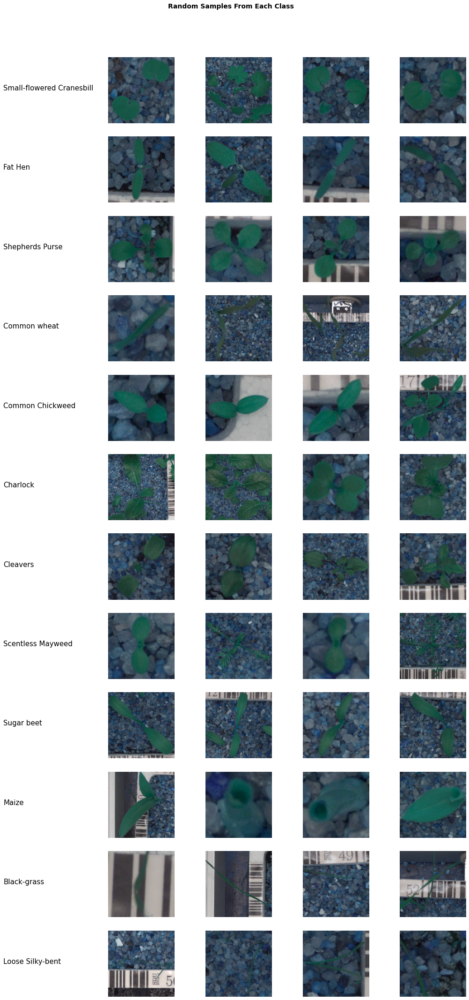

In [25]:
# Visualize images after normalization

fig= plt.figure(figsize= (18, 40))
fig.suptitle('Random Samples From Each Class', fontsize=14, y=.92, horizontalalignment='center', weight='bold')

columns = 5
rows = 13

labelss = list(labels.Label.unique())

for i in range(12):
  lab = labelss[i]
  a = list(labels[labels['Label']==lab].index.values)
  fst_index = a[0]
  lst_index = a[-1]
  for j in range(1,6):
    fig.add_subplot(rows, columns, i*5+j)
    plt.axis('off')
    if j==1:
      plt.text(0.0, 0.5,lab, fontsize=15, wrap=True)
      continue
    r = randint(fst_index, lst_index)
    random_image= images1[r]
    plt.imshow(random_image)
    
plt.show()


## **`Observation:`** 

<a href = #link101> Back to Index </a>

No change in image even after normalization.

In [26]:
#Check how the images blur when different filters are applied

blur_img = []
for i in images1:
  blur_img.append(cv2.GaussianBlur(i, (15, 15), 0))

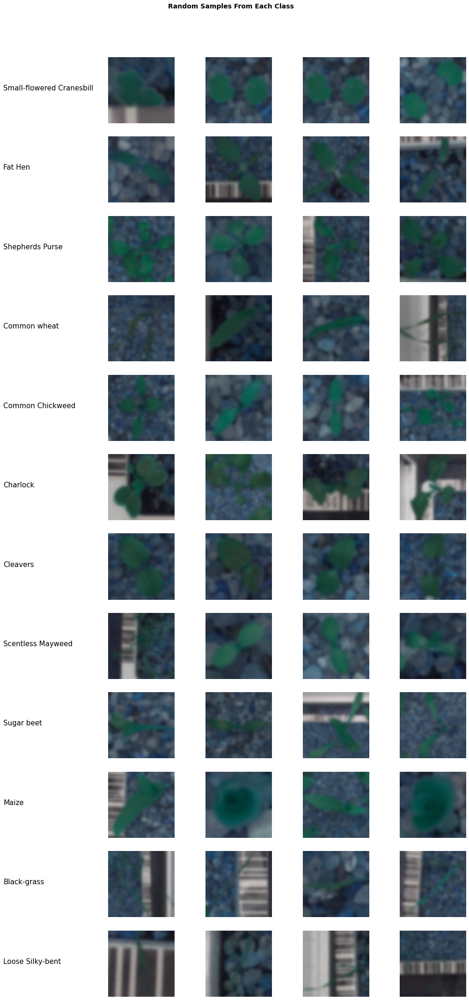

In [27]:
# Visualize Images After Guassian Blurring

fig= plt.figure(figsize= (18, 40))
fig.suptitle('Random Samples From Each Class', fontsize=14, y=.92, horizontalalignment='center', weight='bold')

columns = 5
rows = 13

labelss = list(labels.Label.unique())

for i in range(12):
  lab = labelss[i]
  a = list(labels[labels['Label']==lab].index.values)
  fst_index = a[0]
  lst_index = a[-1]
  for j in range(1,6):
    fig.add_subplot(rows, columns, i*5+j)
    plt.axis('off')
    if j==1:
      plt.text(0.0, 0.5,lab, fontsize=15, wrap=True)
      continue
    r = randint(fst_index, lst_index)
    random_image= blur_img[r]
    plt.imshow(random_image)
    
plt.show()


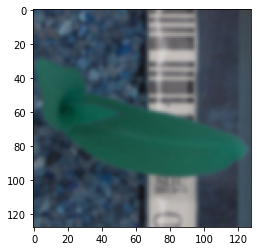

In [28]:
blur_img = []
for i in images1:
  blur_img.append(cv2.GaussianBlur(i, (5, 5), 0))

plt.imshow(blur_img[3731])

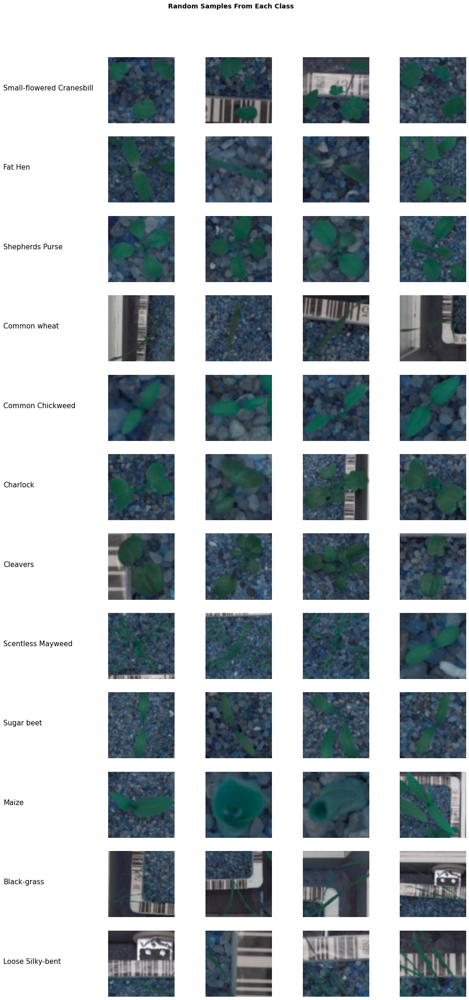

In [29]:
# Visualize Images After Guassian Blurring

fig= plt.figure(figsize= (18, 40))
fig.suptitle('Random Samples From Each Class', fontsize=14, y=.92, horizontalalignment='center', weight='bold')

columns = 5
rows = 13

labelss = list(labels.Label.unique())

for i in range(12):
  lab = labelss[i]
  a = list(labels[labels['Label']==lab].index.values)
  fst_index = a[0]
  lst_index = a[-1]
  for j in range(1,6):
    fig.add_subplot(rows, columns, i*5+j)
    plt.axis('off')
    if j==1:
      plt.text(0.0, 0.5,lab, fontsize=15, wrap=True)
      continue
    r = randint(fst_index, lst_index)
    random_image= blur_img[r]
    plt.imshow(random_image)
    
plt.show()


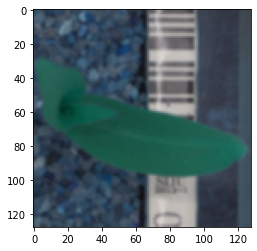

In [79]:
blur_img = []
for i in images1:
  blur_img.append(cv2.GaussianBlur(i, (3, 3), 0))

plt.imshow(blur_img[3731])

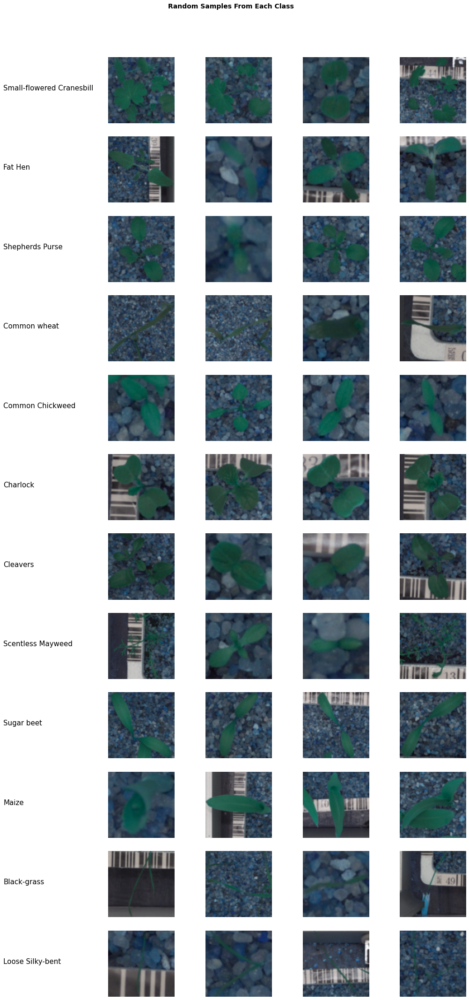

In [31]:
# Visualize Images After Guassian Blurring

fig= plt.figure(figsize= (18, 40))
fig.suptitle('Random Samples From Each Class', fontsize=14, y=.92, horizontalalignment='center', weight='bold')

columns = 5
rows = 13

labelss = list(labels.Label.unique())

for i in range(12):
  lab = labelss[i]
  a = list(labels[labels['Label']==lab].index.values)
  fst_index = a[0]
  lst_index = a[-1]
  for j in range(1,6):
    fig.add_subplot(rows, columns, i*5+j)
    plt.axis('off')
    if j==1:
      plt.text(0.0, 0.5,lab, fontsize=15, wrap=True)
      continue
    r = randint(fst_index, lst_index)
    random_image= blur_img[r]
    plt.imshow(random_image)
    
plt.show()


## **`Observations:`** 

<a href = #link101> Back to Index </a>

For observations, area between Y = 60 to 80 and X = 100 to 120 (area referring to tip of leaf is considered)

It is worth noting that there is some noise at the right hand side of the image.

1. Original Image: The leaf seems somwhat fuzzy with the noise.
2. Blurred 15*15: Fuzziness increases and it is difficult to separate leaf from noise.
3. Blurred 5 * 5 and 3 * 3: Edges appear distinct from noise. 3*3 filter will be chosen for further processing.
4. All these filters were tried during the course of this project lifecycle. However, the best results were produced with 3*3 filter.

## **`Following Cell is for Illustration Purpose Only and Doesn't Impact Model / Data.`** 

<a href = #link101> Back to Index </a>

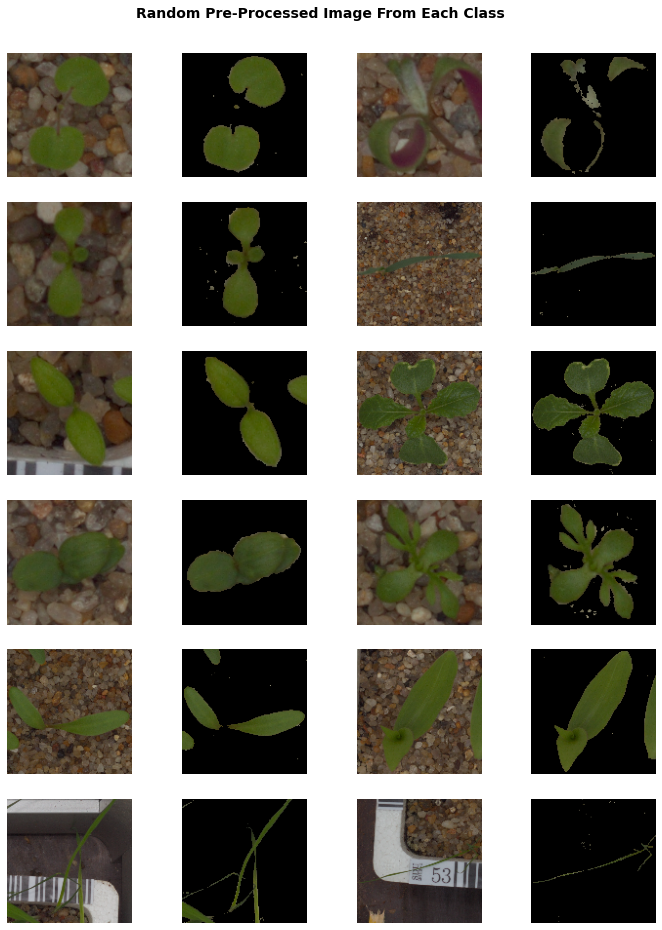

In [32]:
# Illustration purpose only:

# This is an attempt to reduce noise from the images to highlight leaves. 
# However, even after using this approach, model performance didn't improve.
# Therefore, it is now given for illustration purpose only. This can be improved in future iterations.


# Find the start and end indexes of each classification
lower_bound= (24, 50, 0)
upper_bound= (55, 255, 255)

fig= plt.figure(figsize=(12, 16))
fig.suptitle('Random Pre-Processed Image From Each Class', fontsize=14, y=.92, horizontalalignment='center', weight='bold')

columns = 5
rows = 13

labelss = list(labels.Label.unique())

for i in range(12):
  lab = labelss[i]
  a = list(labels[labels['Label']==lab].index.values)
  fst_index = a[0]
  lst_index = a[-1]
  for j in range(1,3):
    r = randint(fst_index, lst_index)
    random_image= images[r]
    img= random_image
    img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #img= cv2.resize(img, (150, 150))
    
    hsv_img= cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    mask = cv2.inRange(hsv_img, lower_bound, upper_bound)
    result = cv2.bitwise_and(img, img, mask=mask)

    #plt.imshow(result)
    fig.add_subplot(6, 4, i*2+1)
    plt.imshow(img)
    plt.axis('off')

    fig.add_subplot(6, 4, i*2+2)
    plt.imshow(result)
    plt.axis('off')
    
plt.show()


## **`Following Cell is for Illustration Purpose Only and Doesn't Impact Model / Data.`** 

<a href = #link101> Back to Index </a>

In [33]:
# Illustration purpose only:


# Code mentioned in above cell works well to separate the leaf part of image from it's background.
# Therefore, this is an attempt to reduce noise from the images to highlight leaves. 
# However, even after using this approach, model performance didn't improve.
# Therefore, it is now given for illustration purpose only. This can be improved in future iterations.

images = np.load('images.npy')

# First convert the datatype of each RGB value in each pixel to float. Currently its a whole number 
# ranging between 0 - 255
images1 = images.astype('float32')

# For normalization, divide each value by 255
images1 /= 255

blur_img1 = []

for i in images1:
  hsv_img= cv2.cvtColor(i, cv2.COLOR_RGB2HSV)
  mask = cv2.inRange(hsv_img, (24, 50, 0), (55, 255, 255))
  result = cv2.bitwise_and(i, i, mask=mask)
  result= result.astype('float64')
  #blur_img1.append(result)
  blur_img1.append(cv2.GaussianBlur(result, (3, 3), 0))

# **`Deliverable – 3:`** <a id = "link104"></a>

<a href = #link101> Back to Index </a>


## **`Approach:`** 

<a href = #link101> Back to Index </a>

Make data compatible: (10 Marks)

1. Convert labels to one-hot-vectors.
2. Print the label for y_train[0].
3. Split the dataset into training, testing, and validation set. (**Hint**: First split images and labels into training and testing set with test_size = 0.3. Then further split test data into test and validation set with test_size = 0.5)
4. Check the shape of data, Reshape data into shapes compatible with Keras models if it’s not already. If it’s already in the compatible shape, then comment in the notebook that it’s already in compatible shape.

In [34]:
#Step1: Get all the labels
y = labels.Label

labels.nunique()

Label    12
dtype: int64

In [35]:
#Print first label in the array

print(labels.iloc[0])
y.iloc[0]

Label    Small-flowered Cranesbill
Name: 0, dtype: object


'Small-flowered Cranesbill'

## **`Important Note:`** 

<a href = #link101> Back to Index </a>

Once labels in "Y-axis" are enumerated, the word names in classes will be replaced by numbers. It will make it difficult to understand and debug the model. Therefore, following code creates a dataframe containing the mapping between word and numeric values.

In [36]:
#Step2: Encode labels. Note: Step 3 is after a few cells.
label_encoder = LabelEncoder()

# First get all the labels in a variable called y for understanding purposes.
y = labels.Label
#print(y[1])

# Convert y from categorical (word) labels to numeric labels. This creates a numpy array
y1 = label_encoder.fit_transform(y)
#print(y1[1])
#print(type(y1))

# Convert above numpy array to Series
y_numeric = pd.Series(y1)

# Convert both series into a dictionary
df_y_dict = {'Label': y, 'Class_number': y_numeric}
print(type(df_y_dict))

# Finally convert dictionary into a dataframe
df_y = pd.DataFrame(df_y_dict)

# Drop duplicates from dataframe to retain 1:1 mapping between labels and their class number
df_y.drop_duplicates(inplace=True)

# Change y to reflect the numeric values. Optional step. 
# It has been carried out to maintain reference integrity of variable y
y = y1

df_y

<class 'dict'>


,Label,Class_number
0,Small-flowered Cranesbill,10
496,Fat Hen,5
971,Shepherds Purse,9
1202,Common wheat,4
1423,Common Chickweed,3
2034,Charlock,1
2424,Cleavers,2
2711,Scentless Mayweed,8
3227,Sugar beet,11
3612,Maize,7


## **`Following Cell is for Illustration Purpose Only and Doesn't Impact Model / Data.`** 

<a href = #link101> Back to Index </a>

## **`Approach:`** 

<a href = #link101> Back to Index </a>

As observed earlier, some classes are over-represented in data while some are under represented. Therefore, following code is an attempt to provide custom class weights to data so that low frequency classes can get higher weightage. Following is the approach:

1. Get % frequency for each class. 
2. Divide 1 with frequency from point 1.
3. Take average (mean) of all the values from point 2.
4. Normalize values in point 2 above by dividing them by mean value obtained in point 3.

In [37]:
# Calculate Class Weights:

y_num = y_numeric.value_counts(normalize=True)
#print(y_num)

# This dictionary stores class and its weight. The same can be passed on while training model.
# Model paramter accepts dictionary input only for class_weight 
class_weight = {}

for i in range(12):
  class_weight[i] = (1/y_num[i])

sum = 0
for val in class_weight.values():
  sum += val
norm_factor= sum / len(class_weight)
#print(norm_factor)

for i in range(12):
  class_weight[i] = (1/y_num[i])/norm_factor

print(class_weight)

{0: 1.3017062904675036, 1: 0.877817318956291, 2: 1.1928528027629042, 3: 0.5603089269933772, 4: 1.5490893863934547, 5: 0.7207342197746389, 6: 0.5234690434143019, 7: 1.5490893863934547, 8: 0.6634665782809176, 9: 1.4820292397963355, 10: 0.6902192628890191, 11: 0.8892175438778014}


In [38]:
#Split train and test set. Validation split is not performed here.
#Validation split will be taken care while training the model.

X_train, X_test, y_train, y_test = train_test_split(blur_img, y, test_size=0.30, random_state=42)

X_train =  np.array(X_train)
X_test =  np.array(X_test)
y_train =  np.array(y_train)
y_test =  np.array(y_test)

In [39]:
#Check the shape of train and test sets

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(3325, 128, 128, 3)
(3325,)
(1425, 128, 128, 3)
(1425,)


In [40]:
#Note that conversion of labels to one-hot-vectors is not yet completed.

In [41]:
#Print y_train[0]

print(y_train[0])
df_y[df_y['Class_number'] == y_train[0]]

2


,Label,Class_number
2424,Cleavers,2


## **`Obserations:`** 

<a href = #link101> Back to Index </a>

The data is not yet ready for using in model. Need to work on Y-train and Y-test data further. 

First re-split Y Test to form two new datasets: validation and Testing.

Use to_categorical function on Y train and Y validation data to convert them to categorical.

In [42]:
print("X_train shape:", X_train.shape)
print("Images in X_train:", X_train.shape[0])
print("Images in X_test:", X_test.shape[0])
print("Max value in X_train:", X_train.max())
print("Min value in X_train:", X_train.min())

X_train shape: (3325, 128, 128, 3)
Images in X_train: 3325
Images in X_test: 1425
Max value in X_train: 1.0
Min value in X_train: 0.0


In [43]:
#Step3: Convert labels to one-hot-vectors.
# Use to_categorical function on Y train and Y test data to convert them to categorical.

#from tensorflow.keras.utils import to_categorical

y_train = to_categorical(y_train, num_classes=12)
#y_test = to_categorical(y_test, num_classes=12)

print("Shape of y_train:", y_train.shape)
print("One value of y_train:", y_train[0])

Shape of y_train: (3325, 12)
One value of y_train: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [44]:
#Print data shape again to confirm the conversion of Y data

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(3325, 128, 128, 3)
(3325, 12)
(1425, 128, 128, 3)
(1425,)


In [45]:
#Split X_test further into testing and validation sets.

X_test_t, X_validation, y_test_t, y_validation = train_test_split(X_test, y_test, test_size=0.50, random_state=42)

y_validation = to_categorical(y_validation, num_classes=12)

#Note: Y test need not undergo to_categorical transformation.

In [46]:
print(X_test_t.shape)
print(y_test_t.shape)
print(X_validation.shape)
print(y_validation.shape)

(712, 128, 128, 3)
(712,)
(713, 128, 128, 3)
(713, 12)


### **`Observations:`** 

<a href = #link101> Back to Index </a>

1. 70% training data and 30% testing data. 

2. Testing data is further split into 50% test and 50% validation sets.

3. Y-Data (train and validation) was converted to categorical, and now we are ready to train and test the model.

4. Similar number of records in training testing and validation sets.

# **`Deliverable – 4:`** <a id = "link105"></a>

<a href = #link101> Back to Index </a>

## **`Approach:`** 

<a href = #link101> Back to Index </a>

Building CNN (15 Marks)

1. Define layers.
2. Set optimizer and loss function. (Use Adam optimizer and categorical crossentropy.)

**Note**: I have tried three callbacks, "EarlyStopping", "ReduceLROnPlateau", and "ModelCheckpoint" during the model building process. However, "ModelCheckpoint" performed better, and therefore is used for final model selection process. Other callback methods are given here for illustration purposes only.

In [60]:
# Initialize the model
model = models.Sequential()

# Add a Convolutional Layer with 32 filters of size 3X3 and activation function as 'relu' 
model.add(Conv2D(filters=32, kernel_size=(3,3), padding='same', activation="relu", input_shape=(128, 128, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.1))

# Add a Convolutional Layer with 32 filters of size 3X3 and activation function as 'relu' 
model.add(Conv2D(filters=32, kernel_size=(3,3), padding='same', activation="relu", input_shape=(128, 128, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))

# Add a Convolutional Layer with 64 filters of size 3X3 and activation function as 'relu' 
model.add(Conv2D(filters=64, kernel_size=(3,3), padding='same', activation="relu", input_shape=(128, 128, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))

# Add a Convolutional Layer with 64 filters of size 3X3 and activation function as 'relu' 
model.add(Conv2D(filters=64, kernel_size=(3,3), padding='same', activation="relu", input_shape=(128, 128, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))

# Add a Convolutional Layer with 64 filters of size 3X3 and activation function as 'relu' 
model.add(Conv2D(filters=64, kernel_size=(3,3), padding='same', activation="relu", input_shape=(128, 128, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))

# Add a Convolutional Layer with 128 filters of size 3X3 and activation function as 'relu' 
model.add(Conv2D(filters=128, kernel_size=3, padding='same', activation="relu", input_shape=(128, 128, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

# Add a Convolutional Layer with 128 filters of size 3X3 and activation function as 'relu' 
model.add(Conv2D(filters=128, kernel_size=3, padding='same', activation="relu", input_shape=(128, 128, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.1))

# Flatten the layer
model.add(Flatten())
model.add(Dropout(0.1))

# Add Fully Connected Layer with 512 units and activation function as 'relu'
model.add(Dense(512, activation="relu"))
model.add(Dropout(0.4))

# Add Fully Connected Layer with 256 units and activation function as 'relu'
model.add(Dense(256, activation="relu"))
model.add(Dropout(0.4))

#model.add(Dense(32, activation="relu"))
#model.add(Dropout(0.1))

#Add Fully Connected Layer with 10 units and activation function as 'softmax'
model.add(Dense(12, activation="softmax"))

In [61]:
#Print model summary

model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 128, 128, 32)      896       
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 64, 64, 32)        0         
_________________________________________________________________
dropout_19 (Dropout)         (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 64, 64, 32)        9248      
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 32, 32, 32)        0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 32, 32, 64)       

In [62]:
# Set Optimizer to Adam And loss to "categorical_crossentropy"
opt= keras.optimizers.Adam(lr=0.0005, amsgrad=True)

# Compile the model
model.compile(loss="categorical_crossentropy", metrics=["accuracy"], optimizer=opt)

# Use one of the following callbacks.

# EarlyStopping: Didn't work the best, unable to set an optimal value for patience. Sometimes it goes low and sometimes very high
callback = tensorflow.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=2, min_delta=0.01)

# ReduceLROnPlateau: Didn't work the best.
reduce_lr = tensorflow.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=0.001)

# This worked the best since number of epochs is not large.
best_cb= tensorflow.keras.callbacks.ModelCheckpoint('model_best.h5', 
                                         monitor='val_loss', 
                                         verbose=1, 
                                         save_best_only=True, 
                                         save_weights_only=False, 
                                         mode='auto')

# Fit the model
history = model.fit(x=X_train
                    , y=y_train, steps_per_epoch= 190
                    , epochs=75
                    #, class_weight = class_weight #Didn't use the class weights calculated above, it impacts model performance.
                    , validation_data=(X_validation, y_validation)
                    , callbacks=[best_cb])

Epoch 1/75
190/190 [==============================] - 4s 16ms/step - loss: 2.4508 - accuracy: 0.1295 - val_loss: 2.4299 - val_accuracy: 0.1346

Epoch 00001: val_loss improved from inf to 2.42993, saving model to model_best.h5
Epoch 2/75
190/190 [==============================] - 3s 14ms/step - loss: 2.4255 - accuracy: 0.1386 - val_loss: 2.4047 - val_accuracy: 0.1346

Epoch 00002: val_loss improved from 2.42993 to 2.40473, saving model to model_best.h5
Epoch 3/75
190/190 [==============================] - 3s 14ms/step - loss: 2.3564 - accuracy: 0.1811 - val_loss: 1.9727 - val_accuracy: 0.3156

Epoch 00003: val_loss improved from 2.40473 to 1.97274, saving model to model_best.h5
Epoch 4/75
190/190 [==============================] - 3s 14ms/step - loss: 1.9011 - accuracy: 0.3337 - val_loss: 1.7181 - val_accuracy: 0.4208

Epoch 00004: val_loss improved from 1.97274 to 1.71808, saving model to model_best.h5
Epoch 5/75
190/190 [==============================] - 3s 13ms/step - loss: 1.6964 - 

In [63]:
#history.history

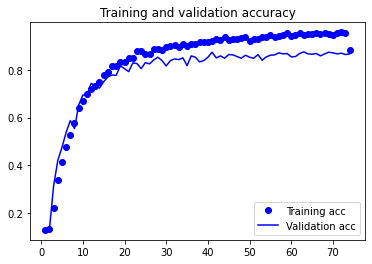

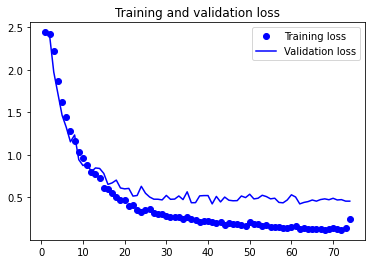

In [64]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.figure()
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

## **`Observation:`** 

<a href = #link101> Back to Index </a>

Both validation loss and validation accuracy stabilize around 25th epoch.

# **`Deliverable – 5:`** <a id = "link106"></a>

<a href = #link101> Back to Index </a>

## **`Approach:`** 

<a href = #link101> Back to Index </a>

Fit and evaluate model and print confusion matrix.

In [65]:
# Following code gives the best model that will be used for testing

model_b = models.load_model('model_best.h5')

In [72]:
# Prediction

y_pred = model_b.predict(X_test_t)
print(y_pred[1])

[1.3251375e-07 1.0520875e-04 3.4479979e-02 2.3869261e-04 2.3065550e-04
 7.9145888e-04 4.9828859e-08 3.9085074e-04 9.5196426e-01 1.0827353e-02
 2.1362746e-06 9.6926268e-04]


## **`Observation:`** 

<a href = #link101> Back to Index </a>

9.5842135e-01 = 0.95842135. This explains that the image belongs to class 9.

In [73]:
# The above code gives the probability of an image to be classified as a class.
# Now Convert those y-prediction probabilities from encdoed to a numeric class using argmax

from sklearn.metrics import accuracy_score
rounded_labels=np.argmax(y_pred, axis=1)
rounded_labels[1]

8

In [74]:
from sklearn.metrics import classification_report as cr
from sklearn.metrics import confusion_matrix as cm

print('Classification Report')
print(cr(y_test_t, rounded_labels))

Classification Report
              precision    recall  f1-score   support

           0       0.65      0.32      0.43        41
           1       0.94      0.84      0.88        55
           2       0.75      0.92      0.83        49
           3       0.95      0.95      0.95        88
           4       0.77      0.82      0.79        33
           5       0.97      0.88      0.92        74
           6       0.77      0.94      0.84       101
           7       0.90      0.93      0.92        30
           8       0.76      0.97      0.85        74
           9       0.89      0.65      0.75        48
          10       0.97      0.90      0.94        72
          11       0.98      0.85      0.91        47

    accuracy                           0.86       712
   macro avg       0.86      0.83      0.83       712
weighted avg       0.86      0.86      0.85       712



In [69]:
# Print Label to class number mapping dataframe for easier understanding of the above and below matrices.

df_y

,Label,Class_number
0,Small-flowered Cranesbill,10
496,Fat Hen,5
971,Shepherds Purse,9
1202,Common wheat,4
1423,Common Chickweed,3
2034,Charlock,1
2424,Cleavers,2
2711,Scentless Mayweed,8
3227,Sugar beet,11
3612,Maize,7


In [76]:
#Y_pred = model.predict_generator(X_test, 128 // batch_size+1)
#y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
matrix = cm(y_test_t, rounded_labels)
print(matrix)

Confusion Matrix
[[13  0  0  0  4  0 24  0  0  0  0  0]
 [ 0 46  6  0  0  0  0  0  1  2  0  0]
 [ 0  1 45  1  1  0  0  0  1  0  0  0]
 [ 0  0  0 84  0  0  0  0  3  0  1  0]
 [ 2  0  0  0 27  1  2  1  0  0  0  0]
 [ 0  1  4  0  0 65  3  0  0  1  0  0]
 [ 5  0  0  0  1  0 95  0  0  0  0  0]
 [ 0  0  1  0  1  0  0 28  0  0  0  0]
 [ 0  0  1  0  0  0  0  1 72  0  0  0]
 [ 0  0  0  2  1  1  0  0 12 31  0  1]
 [ 0  1  2  1  0  0  0  0  2  1 65  0]
 [ 0  0  1  0  0  0  0  1  4  0  1 40]]


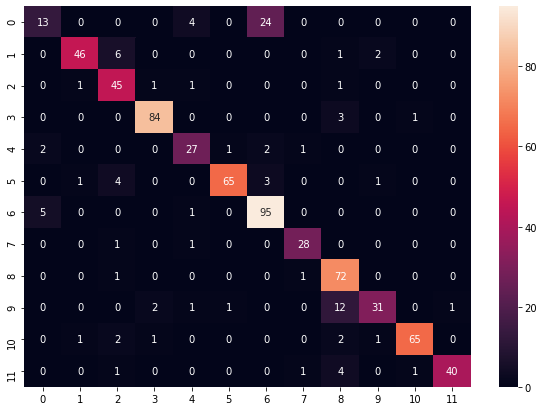

In [77]:
df_cm = pd.DataFrame(matrix, index = [i for i in range(12)],
                     columns = [i for i in range(12)])
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True, fmt='d')

## **`Observations:`** 

<a href = #link101> Back to Index </a>

1. Most of the classes have good scores for precision and recall (both more than 0.8). Therefore, their F1 scores are also good.
2. Model is mis-classifying "Black-Grass" (Class 0) as "Loose Silky-Bent". There can be multiple causes for this mis-classification:
  - "Black-Grass" is has less data (263 records including 41 test cases) in the dataset than "Loose Silky-Bent" (654 records including 101 test cases).
  - If we observe the data visualization for these two classes, it is difficult even for human eye to classify between the two.
  - Only a small portion of the image contains data, while a large portion comprises of image background.
  - Different angles from which images are taken.
  - **Even some "Loose Silky-Bent" are mis-classified as "Black-Grass"**
3. There are 12 cases from Class 9 which are mis-classified as class 8, but no classes from class 8 are mis-classified as class 9.

***Overall, the model performs well to label most of the images, except for "Black-grass". In the next iteration of the model, some more images from this class can be tested for model improvement.***

**Note**: The numbers in confusion matrix may change after each run of the model.

# **`Deliverable – 6:`** <a id = "link107"></a>

<a href = #link101> Back to Index </a>


## **`Approach:`** 

<a href = #link101> Back to Index </a>

Visualize predictions for x_test[2], x_test[3], x_test[33], x_test[36], x_test[59].

In [93]:
print("Following is the label from Y-Test")
df_y[df_y['Class_number'] == y_test_t[2]]

Following is the label from Y-Test


,Label,Class_number
4096,Loose Silky-bent,6


In [94]:
print("Following is the label from Y-Predict")
df_y[df_y['Class_number'] == rounded_labels[2]]

Following is the label from Y-Predict


,Label,Class_number
4096,Loose Silky-bent,6


Following is the corresponding image


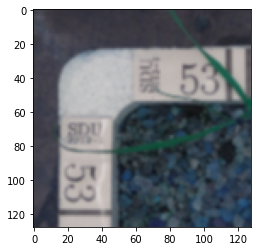

In [95]:
print("Following is the corresponding image")
plt.imshow(X_test_t[2])

In [97]:
print("Following is the label from Y-Test")
df_y[df_y['Class_number'] == y_test_t[3]]

Following is the label from Y-Test


,Label,Class_number
1423,Common Chickweed,3


In [98]:
print("Following is the label from Y-Predict")
df_y[df_y['Class_number'] == rounded_labels[3]]

Following is the label from Y-Predict


,Label,Class_number
1423,Common Chickweed,3


Following is the corresponding image


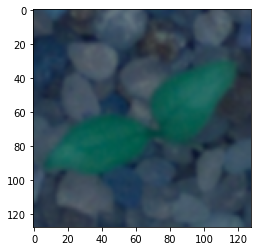

In [99]:
print("Following is the corresponding image")
plt.imshow(X_test_t[3])

In [100]:
print("Following is the label from Y-Test")
df_y[df_y['Class_number'] == y_test_t[33]]

Following is the label from Y-Test


,Label,Class_number
1202,Common wheat,4


In [101]:
print("Following is the label from Y-Predict")
df_y[df_y['Class_number'] == rounded_labels[33]]

Following is the label from Y-Predict


,Label,Class_number
3833,Black-grass,0


Following is the corresponding image


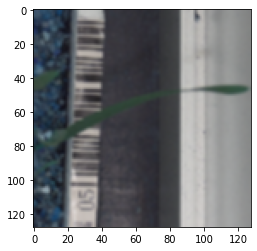

In [102]:
print("Following is the corresponding image")
plt.imshow(X_test_t[33])

In [103]:
print("Following is the label from Y-Test")
df_y[df_y['Class_number'] == y_test_t[36]]

Following is the label from Y-Test


,Label,Class_number
1202,Common wheat,4


In [104]:
print("Following is the label from Y-Predict")
df_y[df_y['Class_number'] == rounded_labels[36]]

Following is the label from Y-Predict


,Label,Class_number
1202,Common wheat,4


Following is the corresponding image


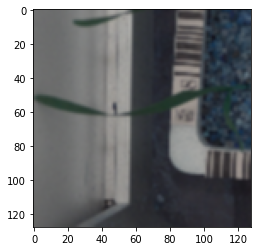

In [105]:
print("Following is the corresponding image")
plt.imshow(X_test_t[36])

In [106]:
print("Following is the label from Y-Test")
df_y[df_y['Class_number'] == y_test_t[59]]

Following is the label from Y-Test


,Label,Class_number
0,Small-flowered Cranesbill,10


In [107]:
print("Following is the label from Y-Predict")
df_y[df_y['Class_number'] == rounded_labels[59]]

Following is the label from Y-Predict


,Label,Class_number
0,Small-flowered Cranesbill,10


Following is the corresponding image


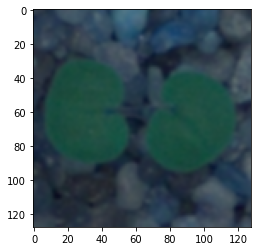

In [108]:
print("Following is the corresponding image")
plt.imshow(X_test_t[59])

From the samples in scope of this deliverable, one was misclassified, while others were properly labelled. The results may vary after each run of the model.